# <span style="color:#336699">Mineração de Dados Aplicada - Aprendizado Não Supervisionado</span>
<hr style="border:2px solid #0077b9;">

<br/>

<div style="text-align: center;font-size: 90%;">
    Professora:
    <br/>
    Vanessa Cristina Oliveira de Souza
    <br/> <br/>
    Autor:
    <br/>
    Ivan Leoni Vilas Boas 
    <br/> <br/>
    Agradecimento Especial:
    <br/>
    Flávio Belizário da Silva Mota 
    <br/><br/>
    ²Universidade Federal de Itajubá (UNIFEI)
    <br/><br/>
    Contato: <a href="mailto:Ivanleoni30@unifei.edu.br">ivanleoni30@unifei.edu.br</a>
    <br/>
    26/10/2022
    <br>
</div>

<br/>

<div style="text-align: justify;  margin-left: 25%; margin-right: 25%;">
<b>Objetivo.</b> Esse caderno Jupyter tem como objetivo apresentar métodos práticos de utilização de algoritmos de aprendizado não supervisionado BisectingKMeans no projeto de Investimento
</div>

# Segmentação de Investimentos com Aprendizado Não Supervisionado
<hr style="border:2px solid #0077b9;">

A segmentação nada mais é do que a divisão dos investimentos em segmentos.

Esses grupos possuem características em comum, o que irá facilitar o trabalho de indicação de investimentos e facilitando o relacionamento com os clientes para diversificarem a carteria com tipos de produtos diferentes, mas que se relacinam entre si


## Cenário do negócio
<hr style="border:2px solid #0077b9;">

Suponha que estamos trabalhando como analistas de dados para uma empresa de <b>corretoras e investimentos</b> e queremos segmentar os investimentos oferecidos para ajudar os gerentes a indicarem novos produtos de investimentos com base nessa segmentação. Portanto, economizaremos  tempo e facilitaremos o trabalho do gerente de modo que ele possa realizar mais acertos de indicações aos clientes conforme um grupo específico de produtos de investimentos selecionados.

Nesse exemplo, todos os dados foram coletados através de varios sites declarados na documentação 01.

## Carregando bibliotecas
<hr style="border:2px solid #0077b9;">

In [1]:
import numpy as np
import pandas as pd
# Bibliotecas gráficas
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

## Carregando e entendendo os dados
<hr style="border:2px solid #0077b9;">

In [2]:
uri = 'C:\\Users\\IVAN LEONI\\Desktop\\notebooks 2\\models\\datasets'
df = pd.read_parquet(f"{uri}/raw.snappy.parquet")

In [3]:
df.shape 
print('O conjunto contém %s registros (linhas) e %s colunas (atributos).' % (df.shape[0], df.shape[1]))

O conjunto contém 5596 registros (linhas) e 16 colunas (atributos).


In [4]:
df.head()

,id,name,market_type,benchmark,strategy,risk,liquidity,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application
0,RRRP3,3R PETROLEUM ÓLEO E GÁS S.A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.131406,0.551172,-0.412630,-0.419996,0.076180,33.60
1,AERI3,AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.609501,0.646211,-1.091786,-0.758763,0.085385,3.47
2,AESB3,AES BRASIL ENERGIA S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.213264,0.288464,-1.072189,-0.336788,0.038291,10.72
3,AFLT3,AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.017996,0.388144,-0.293757,-0.148004,0.056708,8.91
4,AGXY3,AGROGALAXY PARTICIPAÇÕES S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.139182,0.611407,-0.384696,-0.445000,0.075715,7.86


In [5]:
df.count()

id                     5596
name                   5596
market_type            5596
benchmark              5596
strategy               5596
risk                   5596
liquidity              5596
is_income_tax_free     5596
market                 5596
investor               5596
return                 5596
volatility             5596
sharpe                 5596
max_dd                 5596
var                    5596
minimum_application    5596
dtype: int64

In [6]:
print(df.isnull().sum())

id                     0
name                   0
market_type            0
benchmark              0
strategy               0
risk                   0
liquidity              0
is_income_tax_free     0
market                 0
investor               0
return                 0
volatility             0
sharpe                 0
max_dd                 0
var                    0
minimum_application    0
dtype: int64


In [7]:
df.nunique()

id                     5596
name                   5596
market_type               8
benchmark                30
strategy                  7
risk                      6
liquidity                67
is_income_tax_free        2
market                    2
investor                  3
return                 5596
volatility             5596
sharpe                 5596
max_dd                 5008
var                    5596
minimum_application     794
dtype: int64

In [8]:
df.info

<bound method DataFrame.info of                   id                                               name  \
0              RRRP3                        3R PETROLEUM ÓLEO E GÁS S.A   
1              AERI3  AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...   
2              AESB3                            AES BRASIL ENERGIA S.A.   
3              AFLT3       AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A   
4              AGXY3                      AGROGALAXY PARTICIPAÇÕES S.A.   
...              ...                                                ...   
5591  96498654000166  BRADESCO FUNDO DE INVESTIMENTO EM AÇÕES MULTI ...   
5592  96498985000104  BRADESCO FUNDO DE INVESTIMENTO EM COTAS DE FUN...   
5593  97261093000140  BANRISUL PERFORMANCE FUNDO DE INVESTIMENTO EM ...   
5594  97519794000136  ITAÚ REFERENCIADO DI RENDA FIXA EVOLUÇÃO FUNDO...   
5595  97548167000123  JGP STRATEGY MASTER FUNDO DE INVESTIMENTO MULT...   

              market_type benchmark        strategy  risk  liquidit

### Descrição das variáveis antigas...mudar depois para as novas
<hr style="border:2px solid #0077b9;">

<code>id: identificação do Investiment</code></br></br>
<code>name: Nome do investimento </code></br></br>
<code>trade_market: Tipo de Mercado: </code>
><ul>
     <ul>
      <li> 0: CORRETOR DE INVESTIMENTOS (INVESTMENT BROKER) </li>
      <li> 1: BDR / CDA </li>
      <li> 2: BOLSA  </li>
      <li> 3: NOVO MERCADO </li>
      <li> 4: BOVESPA NIVEL 1 </li>
      <li> 5: BOVESPA NIVEL 2 </li>
      <li> 6: MAIS </li> 
    </ul></br>
    <code>market_type: Tipo de Investimento</code>
     <ul>
      <li> 0: CDB </li>
      <li> 1: Fundo Multimercado </li>
      <li> 2: Fundo de Renda Fixa </li>
      <li> 3: LC </li> 
      <li> 4: Fundo de Ações </li>
      <li> 5: DEB </li>
      <li> 6: LCI </li> 
      <li> 7: CRA </li>
      <li> 8: Ações </li>
      <li> 9: FII </li>
      <li> 10: BDR </li>
      <li> 11: Fundo Cambial </li>
      <li> 12: FMP-FGTS </li>
      <li> 13: ATIVO REAL </li>
      <li> 14: CCB </li>
      <li> 15: CRI </li>
      <li> 16: LF </li>
      <li> 17: LCA </li>
      <li> 18: LIG </li>
      <li> 19: RDB </li>
      <li> 20: SUPER </li>
      <li> 21: LFSN </li>
      <li> 22: Outro </li>
    </ul></br>
    <code>benchmark: Taxa referencial</code>
    <ul>
      <li> 0: IBOV </li>
      <li> 1: BDRX </li>
      <li> 2: IFIX </li>
      <li> 3: CDI </li>
      <li> 4: Outro </li>
      <li> 5: SELIC </li>
      <li> 6: IRFM </li>
      <li> 7: USD </li> 
      <li> 8: SMLL </li>
      <li> 9: PTAX </li>
      <li> 10: IEE </li>
      <li> 11: IBX </li>
      <li> 12: IDIV </li>
      <li> 13: IMA </li>
      <li> 14: EUR </li>
      <li> 15: ISE </li>
      <li> 16: IBSPM </li>
      <li> 17: IGC </li>
      <li> 18: PIB </li>
      <li> 19: IGCT </li>
      <li> 20: ICON </li>
      <li> 21: IFNC </li>
      <li> 22: IPCA </li>
      <li> 23: IMOB </li>
      <li> 24: SP500 </li>
      <li> 25: IGPM </li>
      <li> 26: IDI </li>
      <li> 27: IDKA </li>
      <li> 28: OURO </li>
      <li> 29: PTX </li>
      <li> 30: MSCI </li>
      <li> 31: PRÉ </li>
    </ul></br>
    <code>strategy:Estatégia do investimento</code> 
    <ul>
      <li> 0: Renda Variável </li>
      <li> 1: Internacional </li>
      <li> 2: Alternativo </li>
      <li> 3: Outro </li>
      <li> 4: Pós-Fixado </li>
      <li> 5: Multimercado </li>
      <li> 6: Moeda </li>
      <li> 7: Inflação </li> 
      <li> 8: Pré-Fixado </li>
    </ul></br>
    <code>risk: Risco do investimento varia de 0 ate 5, quanto maior o numero maior o risco. </code></br></br>
    <code>liquidity: Liquidez do investimento-representa numero de dias para o resgate. Varia de 0 a 8765 dias.</code></br></br>
    <code>has_periodic_income: Apresenta ou não periodicidade no rendimento</code></br></br>
    <ul>
      <li> 0: sem rendimento por periodo (False) </li>
      <li> 1: com rendimento por periodo (True) </li>
    </ul></br>
    <code>is_income_tax_free: Apresenta ou não IR </code>
    <ul>
      <li> 0: sem IR (False) </li>
      <li> 1: com IR (True) </li>
    </ul></br>
    <code>fees: Apresenta ou não taxas</code>
    <ul>
      <li> 0: sem taxas (NaN) </li>
      <li> 1: com taxas </li>
    </ul></br>
    <code>market: Mercado </code>
    <ul>
      <li> 0: Renda Variável </li>
      <li> 1: Fundo de Investimento </li>
      <li> 2: Renda Fixa </li>
    </ul></br>
    <code>investor: investidor</code>: 
    <ul>
      <li> 0: Público Geral </li>
      <li> 1: Qualificado </li>
      <li> 2: Profissional </li>
    </ul></br>
    <code>return: valor da taxa de retorno do investimento. Varia de -0.9998972988 ate 850.29</code> </br></br>
    <code>volatility: valor da volatilidade do investimento. Varia de 0 ate 27.50</code> </br></br>
    <code>sharpe: indice Sharpe avalia, além da rentabilidade, o risco de um investimento. É fundamental para mensurar o quanto de retorno excedente em relação a um ativo livre de risco é compensado através de seu nível de risco. Varia de  -300671.47 (ou abixo) ate 547.84</code></br></br>
    <code>max_dd: O Máximo Drawdown, também chamado de MDD ou reduções máximas, é a perda máxima observada de um pico até o vale de uma carteira — antes que outro pico seja atingido. Ele, então, é considerado como um indicador de risco de baixa ao longo de um determinado período. Varia de -1 a 0 </code></br></br>
    <code>var: O Value at Risk é um indicador de risco que estima a perda potencial máxima de um investimento para um período de tempo, com um determinado intervalo de confiança. Ou seja, através de um cálculo estatístico, o VaR mostra a exposição ao risco financeiro que um ou mais ativos possuem em determinado dia, semana ou mês. Varia de -0.0005674407813 ate 0.4516746435 </code></br> </br>
    <code>minimum_application: Valor minimo para uma aplicação varia de 0 ate 100.000.000</code></br></br>
</ul>


## Preparação de dataset para aplicação dos modelos (LabelEncoder)
___

#### Aplicação do label encoder

In [9]:
from collections import defaultdict
from sklearn.preprocessing import LabelEncoder

label_encoder = defaultdict(LabelEncoder)


to_label_cols = ["market_type", "benchmark", "strategy", "is_income_tax_free", "market", "investor"]
to_label_df = df[to_label_cols]
not_to_label_cols = list(set(df.columns) - set(to_label_cols))
not_to_label_df = df[not_to_label_cols]

to_label_df = to_label_df.apply(lambda x: label_encoder[x.name].fit_transform(x))
# fit.apply(lambda x: d[x.name].inverse_transform(x))


In [10]:
to_label_df.head()

,market_type,benchmark,strategy,is_income_tax_free,market,investor
0,0,3,6,0,1,1
1,0,3,6,0,1,1
2,0,3,6,0,1,1
3,0,3,6,0,1,1
4,0,3,6,0,1,1


In [11]:
not_to_label_df.head()

,risk,return,var,max_dd,id,sharpe,volatility,liquidity,minimum_application,name
0,4.0,-0.131406,0.076180,-0.419996,RRRP3,-0.412630,0.551172,2,33.60,3R PETROLEUM ÓLEO E GÁS S.A
1,4.0,-0.609501,0.085385,-0.758763,AERI3,-1.091786,0.646211,2,3.47,AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...
2,4.0,-0.213264,0.038291,-0.336788,AESB3,-1.072189,0.288464,2,10.72,AES BRASIL ENERGIA S.A.
3,4.0,-0.017996,0.056708,-0.148004,AFLT3,-0.293757,0.388144,2,8.91,AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A
4,4.0,-0.139182,0.075715,-0.445000,AGXY3,-0.384696,0.611407,2,7.86,AGROGALAXY PARTICIPAÇÕES S.A.


In [12]:
le_df = to_label_df.join(not_to_label_df)
le_df.head()

,market_type,benchmark,strategy,is_income_tax_free,market,investor,risk,return,var,max_dd,id,sharpe,volatility,liquidity,minimum_application,name
0,0,3,6,0,1,1,4.0,-0.131406,0.076180,-0.419996,RRRP3,-0.412630,0.551172,2,33.60,3R PETROLEUM ÓLEO E GÁS S.A
1,0,3,6,0,1,1,4.0,-0.609501,0.085385,-0.758763,AERI3,-1.091786,0.646211,2,3.47,AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...
2,0,3,6,0,1,1,4.0,-0.213264,0.038291,-0.336788,AESB3,-1.072189,0.288464,2,10.72,AES BRASIL ENERGIA S.A.
3,0,3,6,0,1,1,4.0,-0.017996,0.056708,-0.148004,AFLT3,-0.293757,0.388144,2,8.91,AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A
4,0,3,6,0,1,1,4.0,-0.139182,0.075715,-0.445000,AGXY3,-0.384696,0.611407,2,7.86,AGROGALAXY PARTICIPAÇÕES S.A.


#### Aplicação do Standard Scaler e normalização

In [13]:
from sklearn.preprocessing import StandardScaler, normalize

X = le_df.drop(columns=["id", "name"])

scaler = StandardScaler()
scaled = scaler.fit_transform(X)

scaled_df = pd.DataFrame(columns=X.columns, data=scaled)
scaled_df.head()

,market_type,benchmark,strategy,is_income_tax_free,market,investor,risk,return,var,max_dd,sharpe,volatility,liquidity,minimum_application
0,-2.701674,0.058817,1.045522,-0.080466,2.473781,-0.09897,0.370489,-0.358765,2.178526,-1.484191,0.008543,0.785804,-0.521936,-0.079209
1,-2.701674,0.058817,1.045522,-0.080466,2.473781,-0.09897,0.370489,-1.786018,2.540015,-3.377904,-0.211683,0.978984,-0.521936,-0.079222
2,-2.701674,0.058817,1.045522,-0.080466,2.473781,-0.09897,0.370489,-0.603133,0.690602,-1.019054,-0.205328,0.251816,-0.521936,-0.079219
3,-2.701674,0.058817,1.045522,-0.080466,2.473781,-0.09897,0.370489,-0.020202,1.413849,0.036249,0.047090,0.454429,-0.521936,-0.079220
4,-2.701674,0.058817,1.045522,-0.080466,2.473781,-0.09897,0.370489,-0.381978,2.160292,-1.623964,0.017601,0.908240,-0.521936,-0.079220


In [14]:
normalized = normalize(scaled_df)

normalized_df = pd.DataFrame(columns=X.columns, data=normalized)
normalized_df.head()

,market_type,benchmark,strategy,is_income_tax_free,market,investor,risk,return,var,max_dd,sharpe,volatility,liquidity,minimum_application
0,-0.567768,0.012361,0.219721,-0.016910,0.519875,-0.020799,0.077860,-0.075396,0.457826,-0.311909,0.001795,0.165140,-0.109687,-0.016646
1,-0.444138,0.009669,0.171877,-0.013228,0.406674,-0.016270,0.060906,-0.293610,0.417562,-0.555306,-0.034799,0.160939,-0.085803,-0.013024
2,-0.656563,0.014294,0.254084,-0.019555,0.601180,-0.024052,0.090037,-0.146574,0.167831,-0.247651,-0.049899,0.061197,-0.126841,-0.019252
3,-0.652250,0.014200,0.252415,-0.019427,0.597231,-0.023894,0.089445,-0.004877,0.341338,0.008751,0.011369,0.109710,-0.126008,-0.019126
4,-0.560631,0.012205,0.216959,-0.016698,0.513340,-0.020537,0.076881,-0.079265,0.448287,-0.336992,0.003652,0.188471,-0.108308,-0.016439


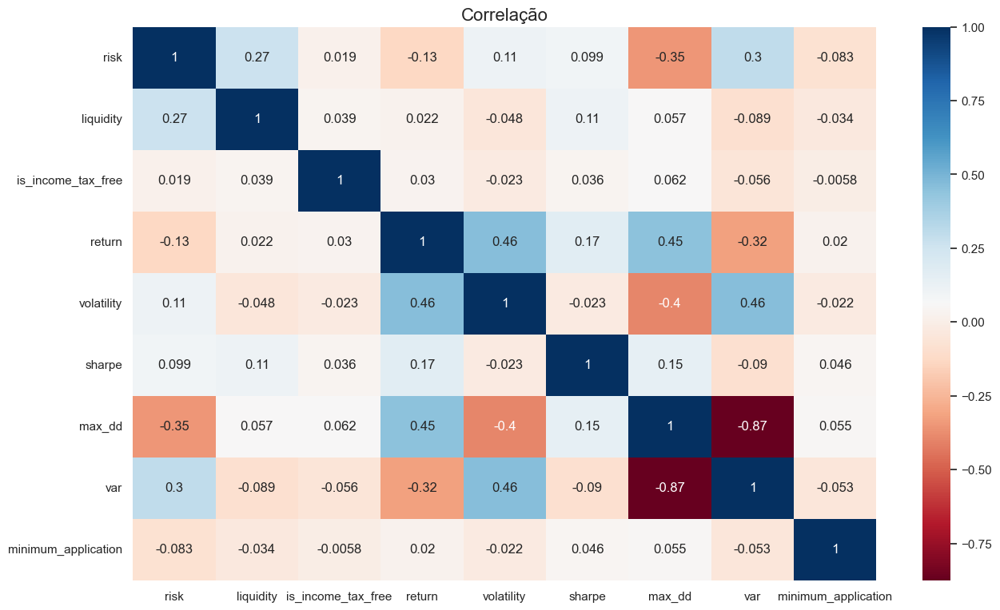

In [15]:
df_std=normalized_df
df_std.corr()
plt.figure(figsize=(15,9))
sns.heatmap(df.corr(),annot=True,cmap='RdBu')
plt.title('Correlação',fontsize=16)
plt.yticks(rotation =0)
plt.show()

## BisectingKMeans
___

In [16]:
n_clusters=4
from sklearn.cluster import BisectingKMeans
clustering = BisectingKMeans(n_clusters, random_state=42).fit(df_std)

## Determinando os segmentos
<hr style="border:2px solid #0077b9;">

In [17]:
df_segm_clustering = df.copy()
df_segm_clustering = pd.DataFrame(data = df, columns = df.columns)
df_segm_clustering['Segmento clustering'] = clustering.labels_ #atributo do modelo que informa os rótulos
df_segm_clustering.head()

,id,name,market_type,benchmark,strategy,risk,liquidity,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,Segmento clustering
0,RRRP3,3R PETROLEUM ÓLEO E GÁS S.A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.131406,0.551172,-0.412630,-0.419996,0.076180,33.60,2
1,AERI3,AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.609501,0.646211,-1.091786,-0.758763,0.085385,3.47,2
2,AESB3,AES BRASIL ENERGIA S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.213264,0.288464,-1.072189,-0.336788,0.038291,10.72,2
3,AFLT3,AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.017996,0.388144,-0.293757,-0.148004,0.056708,8.91,2
4,AGXY3,AGROGALAXY PARTICIPAÇÕES S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.139182,0.611407,-0.384696,-0.445000,0.075715,7.86,2


In [18]:
df_segm_analise = df_segm_clustering.groupby(['Segmento clustering'])
investimentos = df_segm_analise.size()
df_segm_analise = df_segm_analise.mean() # Inserir a métrica necessária = média
df_segm_analise['investimentos'] = investimentos
df_segm_analise.head()

,risk,liquidity,is_income_tax_free,return,volatility,sharpe,max_dd,var,minimum_application,investimentos
Segmento clustering,,,,,,,,,,
0,4.180581,23.972789,0.021645,0.114261,0.060895,0.489264,-0.040421,0.007260,45569.194075,1617
1,2.056274,1.913325,0.000647,0.085587,0.020055,-0.454357,-0.015918,0.002227,527996.804631,1546
2,3.641626,1.923645,0.000000,-0.173339,0.508008,-0.734937,-0.394598,0.059120,2576.539446,812
3,4.318322,14.777915,0.000000,-0.147541,0.233804,-1.202004,-0.280157,0.032498,51418.580518,1621


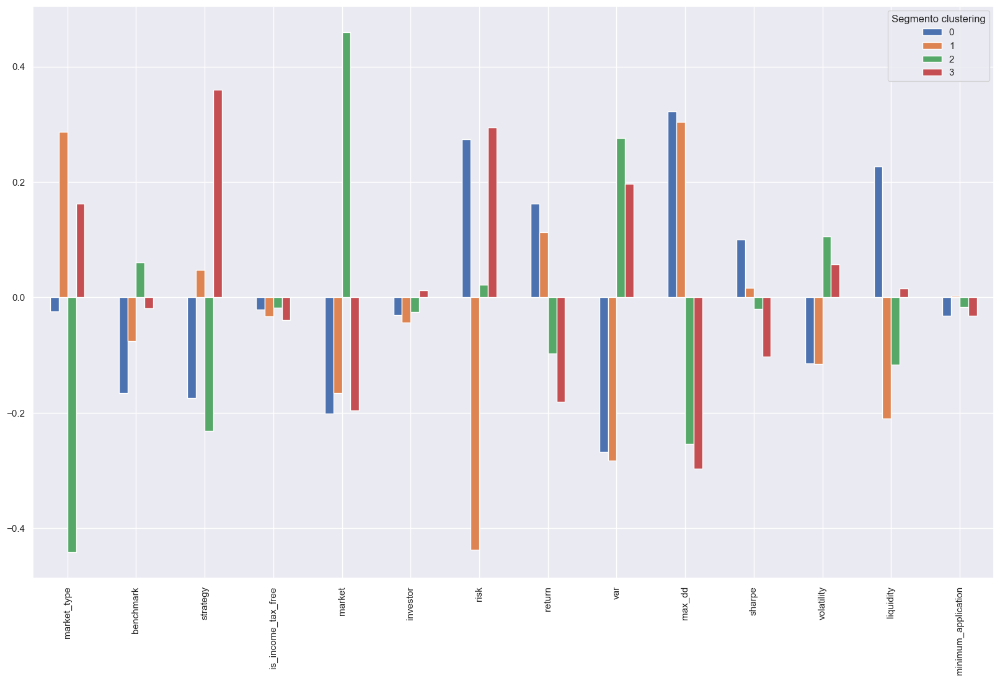

In [19]:
fig, ax = plt.subplots(figsize=(20,12))
df_segm_clustering_std = df_std.copy()
df_segm_clustering_std = pd.DataFrame(data = df_std, columns = df_std.columns)
df_segm_clustering_std['Segmento clustering'] = clustering.labels_ # Atributo do modelo que informa os grupos
df_segm_clustering_std.groupby(['Segmento clustering']).mean().T.plot.bar(ax=ax) # Métrica de análise dos grupos
plt.show()

In [20]:
df_segm_analise.rename({0:'grupo 0', 1:'grupo1', 2:'grupo2', 3:'grupo3' }) # Adicione quantos forem necessários

,risk,liquidity,is_income_tax_free,return,volatility,sharpe,max_dd,var,minimum_application,investimentos
Segmento clustering,,,,,,,,,,
grupo 0,4.180581,23.972789,0.021645,0.114261,0.060895,0.489264,-0.040421,0.007260,45569.194075,1617
grupo1,2.056274,1.913325,0.000647,0.085587,0.020055,-0.454357,-0.015918,0.002227,527996.804631,1546
grupo2,3.641626,1.923645,0.000000,-0.173339,0.508008,-0.734937,-0.394598,0.059120,2576.539446,812
grupo3,4.318322,14.777915,0.000000,-0.147541,0.233804,-1.202004,-0.280157,0.032498,51418.580518,1621


In [21]:
df_segm_clustering['Grupo'] = df_segm_clustering['Segmento clustering'].map( {0:'grupo0', 1:'grupo1', 2:'grupo2', 3:'grupo3'}) # Mapeamento que você definiu acima
df_segm_clustering.head()

,id,name,market_type,benchmark,strategy,risk,liquidity,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,Segmento clustering,Grupo
0,RRRP3,3R PETROLEUM ÓLEO E GÁS S.A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.131406,0.551172,-0.412630,-0.419996,0.076180,33.60,2,grupo2
1,AERI3,AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.609501,0.646211,-1.091786,-0.758763,0.085385,3.47,2,grupo2
2,AESB3,AES BRASIL ENERGIA S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.213264,0.288464,-1.072189,-0.336788,0.038291,10.72,2,grupo2
3,AFLT3,AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.017996,0.388144,-0.293757,-0.148004,0.056708,8.91,2,grupo2
4,AGXY3,AGROGALAXY PARTICIPAÇÕES S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.139182,0.611407,-0.384696,-0.445000,0.075715,7.86,2,grupo2


## Visualizando grupos com PCA
<hr style="border:2px solid #0077b9;">

In [22]:
# Consulte a scikit para entender como implementar a PCA
# Crie uma PCA de 3 componentes

from sklearn.decomposition import PCA
pca = PCA(n_components= 3)
pca.fit(df_std)

# Exiba os valores das componentes
print(pca.explained_variance_ratio_)

[0.67975656 0.08661806 0.06954306]


In [23]:
grupos_3d = pca.transform(df_std) # Método de transformação da PCA
grupos_3d.shape
grupos_df_3d = pd.DataFrame(grupos_3d).loc[:,:2]
grupos_df_3d.columns = ['PC1','PC2','PC3']
grupos_df_3d.head()

,PC1,PC2,PC3
0,0.782703,-0.568417,0.528848
1,0.845423,-0.555377,0.469937
2,0.730524,-0.528225,0.542247
3,0.685626,-0.504147,0.542263
4,0.787813,-0.570264,0.526409


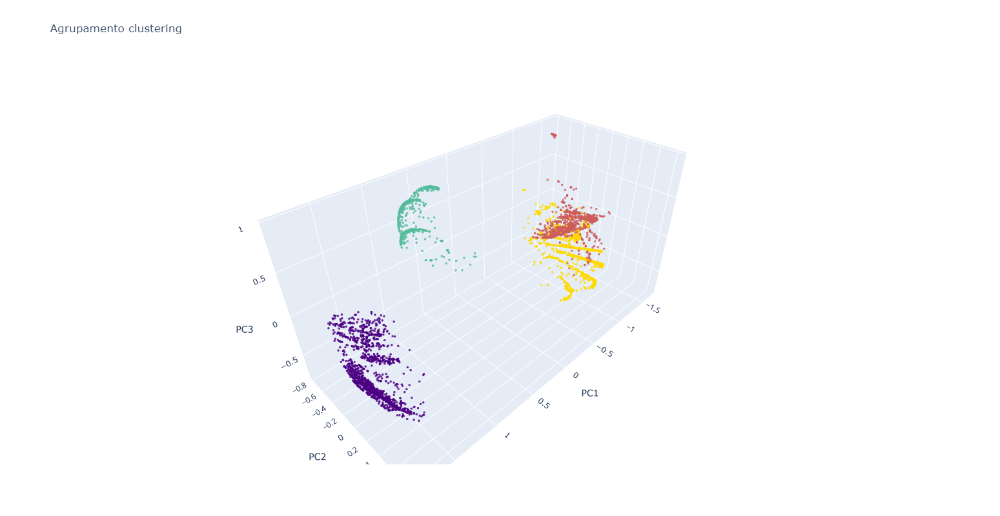

In [34]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>  '''))
  init_notebook_mode(connected=False)
  
  
from plotly.offline import init_notebook_mode
enable_plotly_in_cell()
init_notebook_mode(connected=False)

import plotly.offline as py
import plotly.graph_objs as go

trace1 = go.Scatter3d(
    x=grupos_df_3d["PC1"],
    y=grupos_df_3d["PC2"],
    z=grupos_df_3d["PC3"],
    mode='markers',
    text= clustering.labels_,
    marker=dict(
        size=2,
        color= clustering.labels_,         
        colorscale=[[0.0,"indianred"],[0.2,"darkorange"],[0.4,"yellow"],[0.6,"mediumseagreen"],[0.8,"skyblue"],[1.0, "indigo"]],
        opacity=0.8
    )
)

data = [trace1]
layout = go.Layout(
    showlegend=False,
    title="Agrupamento clustering",
    scene = dict(
        xaxis = dict(title="PC1"),
        yaxis = dict(title="PC2"),
        zaxis = dict(title="PC3")
    ),
    width=800,
    height=800
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')

## Agrupamento Hierárquico
<hr style="border:2px solid #0077b9;">

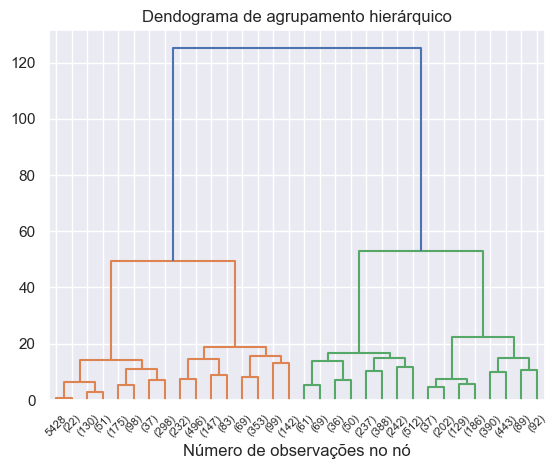

In [35]:
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    dendrogram(linkage_matrix, **kwargs)

# Consultar a scikit para encontrar o método de agrupamento acumulativo
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

dend = AgglomerativeClustering(distance_threshold=0, n_clusters= None) # Chamada do método
dend = dend.fit(df_std)
plt.title("Dendograma de agrupamento hierárquico")
plot_dendrogram(dend, truncate_mode="level", p=4)
plt.xlabel("Número de observações no nó")
plt.show()

## Análise dos resutados obtidos
<hr style="border:2px solid #0077b9;">

In [36]:
df_segm_clustering.head(10)

,market_type,benchmark,strategy,is_income_tax_free,market,investor,risk,return,var,max_dd,sharpe,volatility,liquidity,minimum_application,Segmento clustering
0,-0.567768,0.012361,0.219721,-0.016910,0.519875,-0.020799,0.077860,-0.075396,0.457826,-0.311909,0.001795,0.165140,-0.109687,-0.016646,2
1,-0.444138,0.009669,0.171877,-0.013228,0.406674,-0.016270,0.060906,-0.293610,0.417562,-0.555306,-0.034799,0.160939,-0.085803,-0.013024,2
2,-0.656563,0.014294,0.254084,-0.019555,0.601180,-0.024052,0.090037,-0.146574,0.167831,-0.247651,-0.049899,0.061197,-0.126841,-0.019252,2
3,-0.652250,0.014200,0.252415,-0.019427,0.597231,-0.023894,0.089445,-0.004877,0.341338,0.008751,0.011369,0.109710,-0.126008,-0.019126,2
4,-0.560631,0.012205,0.216959,-0.016698,0.513340,-0.020537,0.076881,-0.079265,0.448287,-0.336992,0.003652,0.188471,-0.108308,-0.016439,2
5,-0.590516,0.012856,0.228524,-0.017588,0.540705,-0.021632,0.080979,-0.124969,0.490424,-0.099774,-0.013007,0.140121,-0.114082,-0.017316,2
6,-0.610539,0.013292,0.236273,-0.018184,0.559038,-0.022366,0.083725,-0.210592,0.249083,-0.344754,-0.051245,0.093652,-0.117950,-0.017902,2
7,-0.455352,0.009913,0.176217,-0.013562,0.416941,-0.016681,0.062444,-0.301340,0.445355,-0.508660,-0.036622,0.161751,-0.087969,-0.013352,2
8,-0.425554,0.009265,0.164685,-0.012675,0.389658,-0.015589,0.058358,-0.249706,0.438085,-0.575718,-0.017677,0.207616,-0.082213,-0.012479,2
9,-0.472821,0.010294,0.182977,-0.014082,0.432938,-0.017321,0.064840,-0.349639,0.332958,-0.540286,-0.066549,0.112841,-0.091344,-0.013864,2


In [37]:
df_segm_clustering = df_std.copy()
df_segm_clustering = pd.DataFrame(data = df_std, columns = df_std.columns)
df_segm_clustering['Segmento clustering'] = clustering.labels_ #atributo do modelo que informa os rótulos
df_segm_clustering.head()

,market_type,benchmark,strategy,is_income_tax_free,market,investor,risk,return,var,max_dd,sharpe,volatility,liquidity,minimum_application,Segmento clustering
0,-0.567768,0.012361,0.219721,-0.016910,0.519875,-0.020799,0.077860,-0.075396,0.457826,-0.311909,0.001795,0.165140,-0.109687,-0.016646,2
1,-0.444138,0.009669,0.171877,-0.013228,0.406674,-0.016270,0.060906,-0.293610,0.417562,-0.555306,-0.034799,0.160939,-0.085803,-0.013024,2
2,-0.656563,0.014294,0.254084,-0.019555,0.601180,-0.024052,0.090037,-0.146574,0.167831,-0.247651,-0.049899,0.061197,-0.126841,-0.019252,2
3,-0.652250,0.014200,0.252415,-0.019427,0.597231,-0.023894,0.089445,-0.004877,0.341338,0.008751,0.011369,0.109710,-0.126008,-0.019126,2
4,-0.560631,0.012205,0.216959,-0.016698,0.513340,-0.020537,0.076881,-0.079265,0.448287,-0.336992,0.003652,0.188471,-0.108308,-0.016439,2


In [38]:
df_std.head()

,market_type,benchmark,strategy,is_income_tax_free,market,investor,risk,return,var,max_dd,sharpe,volatility,liquidity,minimum_application,Segmento clustering
0,-0.567768,0.012361,0.219721,-0.016910,0.519875,-0.020799,0.077860,-0.075396,0.457826,-0.311909,0.001795,0.165140,-0.109687,-0.016646,2
1,-0.444138,0.009669,0.171877,-0.013228,0.406674,-0.016270,0.060906,-0.293610,0.417562,-0.555306,-0.034799,0.160939,-0.085803,-0.013024,2
2,-0.656563,0.014294,0.254084,-0.019555,0.601180,-0.024052,0.090037,-0.146574,0.167831,-0.247651,-0.049899,0.061197,-0.126841,-0.019252,2
3,-0.652250,0.014200,0.252415,-0.019427,0.597231,-0.023894,0.089445,-0.004877,0.341338,0.008751,0.011369,0.109710,-0.126008,-0.019126,2
4,-0.560631,0.012205,0.216959,-0.016698,0.513340,-0.020537,0.076881,-0.079265,0.448287,-0.336992,0.003652,0.188471,-0.108308,-0.016439,2


In [39]:
dfa= df_segm_clustering 
X = dfa.drop(columns=['Segmento clustering'])
y = df['Segmento clustering']

In [40]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
y_train.value_counts()

3    1319
0    1285
1    1240
2     632
Name: Segmento clustering, dtype: int64

##  DecisionTreeClassifier 
<hr style="border:2px solid #0077b9;">

Utilizado DecisionTreeClassifier para fazer analise via arvore e assim tentar justificar os resulados obtidos no não supervisionado

In [41]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(max_depth=100, random_state=42)
clf.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=100, random_state=42)

In [42]:
import os
os.environ["PATH"] += os.pathsep + 'C:\\Program Files\\Graphviz\\bin'

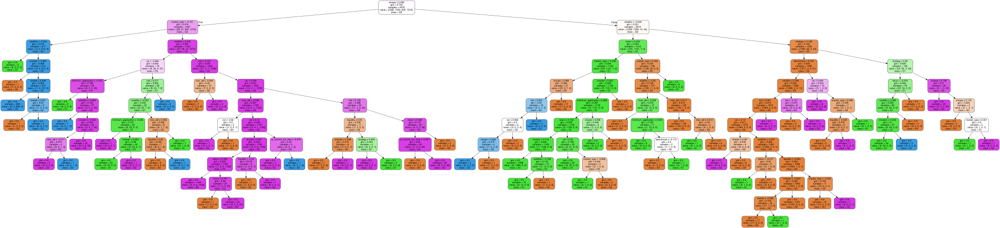

In [43]:
from sklearn import tree
import graphviz 
dot_data = tree.export_graphviz(clf, out_file=None,
                               feature_names=['market_type', 'benchmark','strategy', 'is_income_tax_free', 'market','investor', 'volatility', 'var', 'risk', 'sharpe','minimum_application', 'liquidity', 'return', 'max_dd'],
                               class_names=['G0','G1','G2','G3'],filled=True,
                               rounded=True,  
                              special_characters=True) 
graph = graphviz.Source(dot_data)
graph.render("Gini")
graph

## Preparação de dataset para aplicação dos modelos (OneHot)
___

In [44]:
df2 = pd.read_parquet(f"{uri}/raw.snappy.parquet")
X = df2.drop(columns=["id", "name"])

one_hot = pd.get_dummies(X)
one_hot["is_income_tax_free"] = one_hot["is_income_tax_free"].replace({True: 1, False: 0})
one_hot.head()

,risk,liquidity,is_income_tax_free,return,volatility,sharpe,max_dd,var,minimum_application,market_type_Ações,...,strategy_Internacional,strategy_Moeda,strategy_Multimercado,strategy_Pós-Fixado,strategy_Renda Variável,market_Fundo de Investimento,market_Renda Variável,investor_Profissional,investor_Público Geral,investor_Qualificado
0,4.0,2,0,-0.131406,0.551172,-0.412630,-0.419996,0.076180,33.60,1,...,0,0,0,0,1,0,1,0,1,0
1,4.0,2,0,-0.609501,0.646211,-1.091786,-0.758763,0.085385,3.47,1,...,0,0,0,0,1,0,1,0,1,0
2,4.0,2,0,-0.213264,0.288464,-1.072189,-0.336788,0.038291,10.72,1,...,0,0,0,0,1,0,1,0,1,0
3,4.0,2,0,-0.017996,0.388144,-0.293757,-0.148004,0.056708,8.91,1,...,0,0,0,0,1,0,1,0,1,0
4,4.0,2,0,-0.139182,0.611407,-0.384696,-0.445000,0.075715,7.86,1,...,0,0,0,0,1,0,1,0,1,0


In [45]:
scaler2 = StandardScaler()
scaled2 = scaler.fit_transform(one_hot)
scaled_df2 = pd.DataFrame(columns=one_hot.columns, data=scaled2)
scaled_df2.head()

,risk,liquidity,is_income_tax_free,return,volatility,sharpe,max_dd,var,minimum_application,market_type_Ações,...,strategy_Internacional,strategy_Moeda,strategy_Multimercado,strategy_Pós-Fixado,strategy_Renda Variável,market_Fundo de Investimento,market_Renda Variável,investor_Profissional,investor_Público Geral,investor_Qualificado
0,0.370489,-0.521936,-0.080466,-0.358765,0.785804,0.008543,-1.484191,2.178526,-0.079209,4.39876,...,-0.234209,-0.099629,-0.763855,-0.553404,1.596405,-2.473781,2.473781,-0.154219,0.280804,-0.22907
1,0.370489,-0.521936,-0.080466,-1.786018,0.978984,-0.211683,-3.377904,2.540015,-0.079222,4.39876,...,-0.234209,-0.099629,-0.763855,-0.553404,1.596405,-2.473781,2.473781,-0.154219,0.280804,-0.22907
2,0.370489,-0.521936,-0.080466,-0.603133,0.251816,-0.205328,-1.019054,0.690602,-0.079219,4.39876,...,-0.234209,-0.099629,-0.763855,-0.553404,1.596405,-2.473781,2.473781,-0.154219,0.280804,-0.22907
3,0.370489,-0.521936,-0.080466,-0.020202,0.454429,0.047090,0.036249,1.413849,-0.079220,4.39876,...,-0.234209,-0.099629,-0.763855,-0.553404,1.596405,-2.473781,2.473781,-0.154219,0.280804,-0.22907
4,0.370489,-0.521936,-0.080466,-0.381978,0.908240,0.017601,-1.623964,2.160292,-0.079220,4.39876,...,-0.234209,-0.099629,-0.763855,-0.553404,1.596405,-2.473781,2.473781,-0.154219,0.280804,-0.22907


In [46]:
normalized2 = normalize(scaled_df2)
normalized_df2 = pd.DataFrame(columns=one_hot.columns, data=normalized2)
normalized_df2.head()

,risk,liquidity,is_income_tax_free,return,volatility,sharpe,max_dd,var,minimum_application,market_type_Ações,...,strategy_Internacional,strategy_Moeda,strategy_Multimercado,strategy_Pós-Fixado,strategy_Renda Variável,market_Fundo de Investimento,market_Renda Variável,investor_Profissional,investor_Público Geral,investor_Qualificado
0,0.051385,-0.072390,-0.011160,-0.049759,0.108988,0.001185,-0.205851,0.302152,-0.010986,0.610089,...,-0.032484,-0.013818,-0.105943,-0.076755,0.221414,-0.343103,0.343103,-0.021389,0.038946,-0.031771
1,0.045486,-0.064079,-0.009879,-0.219272,0.120191,-0.025989,-0.414710,0.311841,-0.009726,0.540042,...,-0.028754,-0.012232,-0.093780,-0.067942,0.195993,-0.303710,0.303710,-0.018934,0.034475,-0.028123
2,0.054464,-0.076727,-0.011829,-0.088663,0.037018,-0.030184,-0.149805,0.101522,-0.011646,0.646637,...,-0.034430,-0.014646,-0.112290,-0.081353,0.234679,-0.363657,0.363657,-0.022671,0.041279,-0.033674
3,0.054332,-0.076541,-0.011800,-0.002963,0.066641,0.006906,0.005316,0.207339,-0.011618,0.645073,...,-0.034346,-0.014611,-0.112018,-0.081156,0.234111,-0.362777,0.362777,-0.022616,0.041180,-0.033593
4,0.051101,-0.071990,-0.011099,-0.052686,0.125272,0.002428,-0.223990,0.297965,-0.010927,0.606713,...,-0.032304,-0.013742,-0.105357,-0.076330,0.220189,-0.341204,0.341204,-0.021271,0.038731,-0.031595


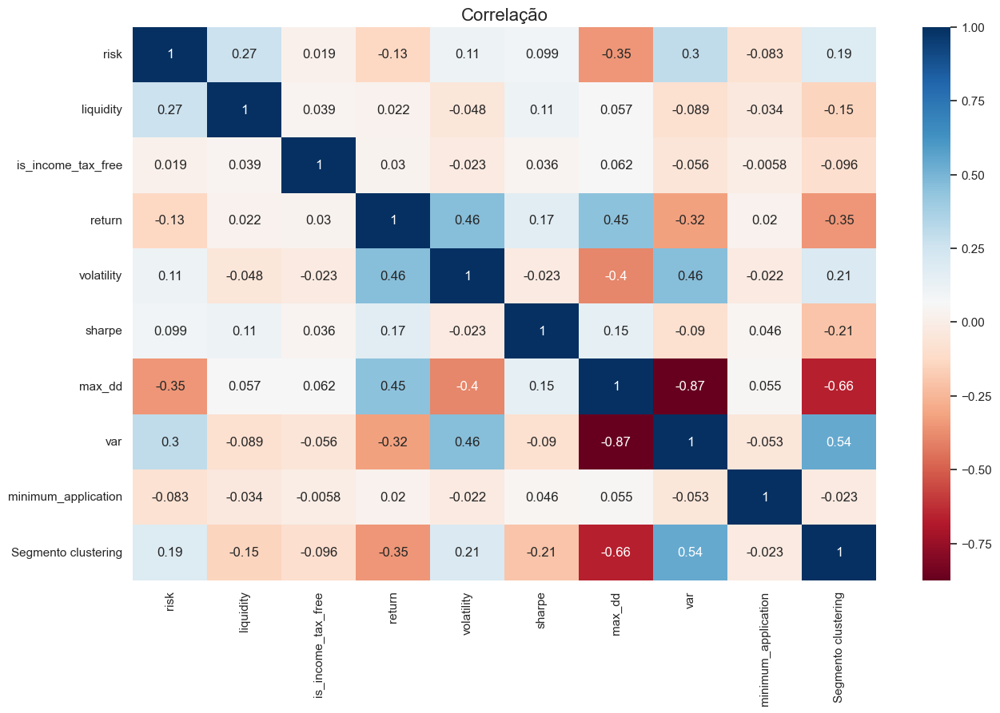

In [47]:
df2_std2=normalized_df2
df2_std2.corr()
plt.figure(figsize=(15,9))
sns.heatmap(df.corr(),annot=True,cmap='RdBu')
plt.title('Correlação',fontsize=16)
plt.yticks(rotation =0)
plt.show()

## BisectingKMeans
<hr style="border:2px solid #0077b9;">

In [48]:
n_clusters=4
from sklearn.cluster import BisectingKMeans
clustering = BisectingKMeans(n_clusters, random_state=42).fit(df2_std2)

## Determinando os segmentos
<hr style="border:2px solid #0077b9;">

Vamos associar cada rótulo de grupo gerado pelo K-means na etapa anterior ao seu registro equivalente:

In [49]:
df_segm_clustering = df2.copy()
df_segm_clustering = pd.DataFrame(data = df, columns = df.columns)
df_segm_clustering['Segmento clustering'] = clustering.labels_ # Qual atributo do modelo me informa os rótulos?
df_segm_clustering.head()

,id,name,market_type,benchmark,strategy,risk,liquidity,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,Segmento clustering,Grupo
0,RRRP3,3R PETROLEUM ÓLEO E GÁS S.A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.131406,0.551172,-0.412630,-0.419996,0.076180,33.60,1,grupo2
1,AERI3,AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.609501,0.646211,-1.091786,-0.758763,0.085385,3.47,1,grupo2
2,AESB3,AES BRASIL ENERGIA S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.213264,0.288464,-1.072189,-0.336788,0.038291,10.72,1,grupo2
3,AFLT3,AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.017996,0.388144,-0.293757,-0.148004,0.056708,8.91,1,grupo2
4,AGXY3,AGROGALAXY PARTICIPAÇÕES S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.139182,0.611407,-0.384696,-0.445000,0.075715,7.86,1,grupo2


Agora que temos os rótulos de grupo de cada registros, podemos analisar esses registros por grupo considerando como métrica a  <b> média. </b>

In [50]:
df_segm_analise = df_segm_clustering.groupby(['Segmento clustering'])
investimentos = df_segm_analise.size()
df_segm_analise = df_segm_analise.mean() # Inserir a métrica necessária = média
df_segm_analise['investimentos'] = investimentos
df_segm_analise.head()

,risk,liquidity,is_income_tax_free,return,volatility,sharpe,max_dd,var,minimum_application,investimentos
Segmento clustering,,,,,,,,,,
0,4.061824,19.591448,0.000000,0.068776,0.076209,-0.047277,-0.071086,0.010418,43962.459310,1941
1,4.241988,12.694572,0.000000,-0.186586,0.287634,-1.047196,-0.323852,0.039062,37474.771347,1529
2,3.437877,5.697226,0.031363,-0.033397,0.381515,-0.807748,-0.263085,0.041231,553918.483908,829
3,2.063223,3.915960,0.007710,0.089932,0.013092,-0.072447,-0.010234,0.001340,288035.184086,1297


Podemos gerar um gráfico para analisar os valores de cada atributo por grupo:

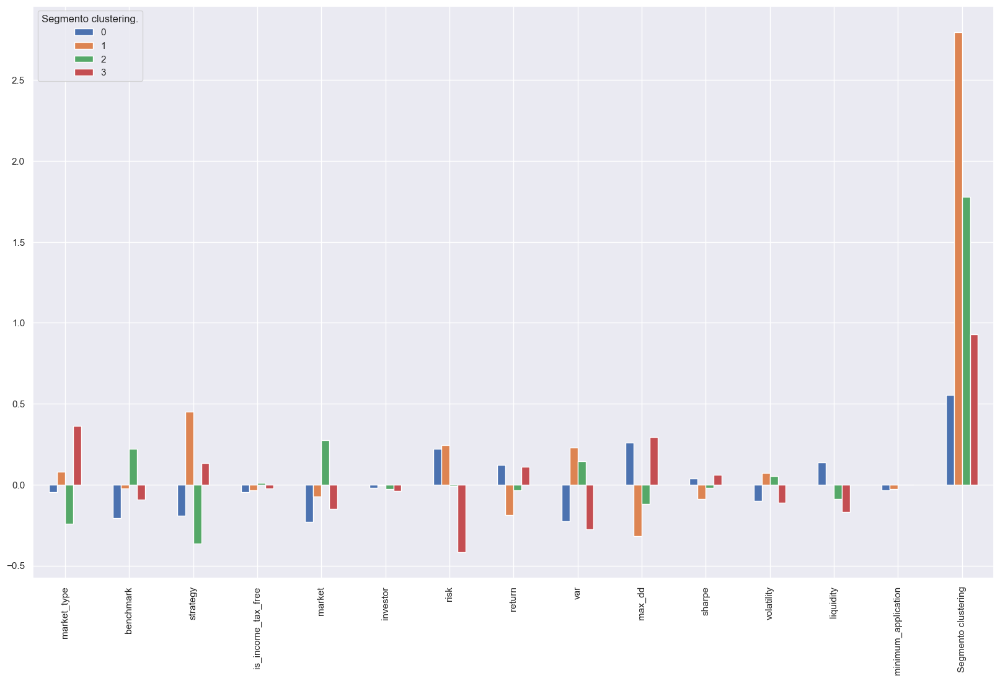

In [51]:
fig, ax = plt.subplots(figsize=(20,12))
df_segm_clustering_std = df2_std2.copy()
df_segm_clustering_std = pd.DataFrame(data = df_std, columns = df_std.columns)
df_segm_clustering_std['Segmento clustering.'] = clustering.labels_ # Atributo do modelo que informa os grupos
df_segm_clustering_std.groupby(['Segmento clustering.']).mean().T.plot.bar(ax=ax) # Métrica de análise dos grupos
plt.show()

Podemos então definir os grupos considerando essas informações. Analise as informações que tem e tente dar nome a cada um dos grupos gerados:

In [52]:
df_segm_analise.rename({0:'Grupo 0', 1:'Grupo 1', 2:'Grupo 2', 3:'Grupo 3'}) # Adicione quantos forem necessários

,risk,liquidity,is_income_tax_free,return,volatility,sharpe,max_dd,var,minimum_application,investimentos
Segmento clustering,,,,,,,,,,
Grupo 0,4.061824,19.591448,0.000000,0.068776,0.076209,-0.047277,-0.071086,0.010418,43962.459310,1941
Grupo 1,4.241988,12.694572,0.000000,-0.186586,0.287634,-1.047196,-0.323852,0.039062,37474.771347,1529
Grupo 2,3.437877,5.697226,0.031363,-0.033397,0.381515,-0.807748,-0.263085,0.041231,553918.483908,829
Grupo 3,2.063223,3.915960,0.007710,0.089932,0.013092,-0.072447,-0.010234,0.001340,288035.184086,1297


In [53]:
df_segm_clustering['Grupo'] = df_segm_clustering['Segmento clustering'].map( {0:'grupo0', 1:'grupo1', 2:'grupo2', 3:'grupo3'}) # Mapeamento que você definiu acima
df_segm_clustering.head()

,id,name,market_type,benchmark,strategy,risk,liquidity,is_income_tax_free,market,investor,return,volatility,sharpe,max_dd,var,minimum_application,Segmento clustering,Grupo
0,RRRP3,3R PETROLEUM ÓLEO E GÁS S.A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.131406,0.551172,-0.412630,-0.419996,0.076180,33.60,1,grupo1
1,AERI3,AERIS IND. E COM. DE EQUIP. GERACAO DE ENERGIA...,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.609501,0.646211,-1.091786,-0.758763,0.085385,3.47,1,grupo1
2,AESB3,AES BRASIL ENERGIA S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.213264,0.288464,-1.072189,-0.336788,0.038291,10.72,1,grupo1
3,AFLT3,AFLUENTE TRANSMISSÃO DE ENERGIA ELÉTRICA S/A,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.017996,0.388144,-0.293757,-0.148004,0.056708,8.91,1,grupo1
4,AGXY3,AGROGALAXY PARTICIPAÇÕES S.A.,Ações,IBOV,Renda Variável,4.0,2,False,Renda Variável,Público Geral,-0.139182,0.611407,-0.384696,-0.445000,0.075715,7.86,1,grupo1


## Visualizando grupos com PCA
<hr style="border:2px solid #0077b9;">

Nosso conjunto de dados tem muitas dimensões, sendo assim, não é fácil enxergar os grupos em um espaço tridimensional. Podemos adotar uma estratégia chamada Análise de Componentes Principais ou PCA (Principal Component Analysis).

É uma técnica de análise multivariada que pode ser usada para analisar inter-relações entre um grande número de variáveis e explicar essas variáveis em termos de suas dimensões inerentes (Componentes).

O objetivo é encontrar um meio de condensar a informação contida em várias variáveis originais em um conjunto menor de variáveis estatísticas (componentes) com uma perda mínima de informação.

O número de componentes principais se torna o número de variáveis consideradas na análise, mas geralmente as primeiras componentes são as mais importantes já que explicam a maior parte da variação total.

As componentes principais em geral são extraídas via matriz de covariância, mas também podem ser extraídas via matriz de correlação.

In [54]:
# Consulte a scikit para entender como implementar a PCA
# Crie uma PCA de 3 componentes

from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca.fit(df2_std2)

# Exiba os valores das componentes
print(pca.explained_variance_ratio_)


[0.30406069 0.23419387 0.0938956 ]


Agora, vamos criar um DataFrame que armazena a tranformação de cada um dos resgitros do conjunto reduzidos às 3 componentes:

In [55]:
grupos_3d = pca.transform(df2_std2) # Método de transformação da PCA
grupos_3d.shape
grupos_df_3d = pd.DataFrame(grupos_3d).loc[:,:2]
grupos_df_3d.columns = ['PC1','PC2','PC3']
grupos_df_3d.head()

,PC1,PC2,PC3
0,0.652574,-0.274185,0.507532
1,0.687604,-0.317965,0.492880
2,0.621615,-0.236300,0.486289
3,0.591556,-0.215144,0.488317
4,0.655785,-0.277577,0.507945


O trecho de código abaixo garante que estamos usando a versão mais recente da biblioteca plotly:

In [56]:
#!pip uninstall -q -y plotly
#!pip install -q plotly

Essa função serve para plotar um gráfico em 3 dimensões com as observações (registros) e seus respectivos grupos:

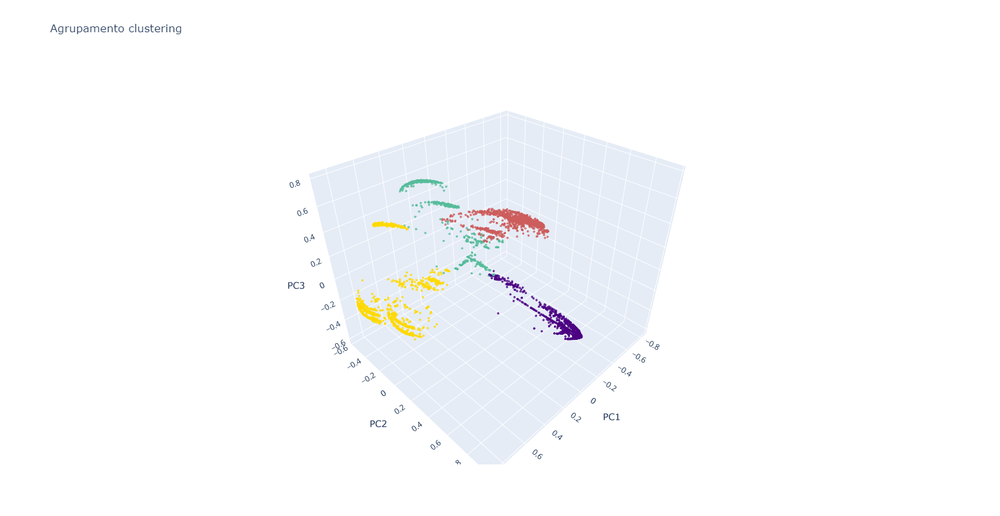

In [57]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>  '''))
  init_notebook_mode(connected=False)
  
  
from plotly.offline import init_notebook_mode
enable_plotly_in_cell()
init_notebook_mode(connected=False)

import plotly.offline as py
import plotly.graph_objs as go

trace1 = go.Scatter3d(
    x=grupos_df_3d["PC1"],
    y=grupos_df_3d["PC2"],
    z=grupos_df_3d["PC3"],
    mode='markers',
    text= clustering.labels_,
    marker=dict(
        size=2,
        color= clustering.labels_,         
        colorscale=[[0.0,"indianred"],[0.2,"darkorange"],[0.4,"yellow"],[0.6,"mediumseagreen"],[0.8,"skyblue"],[1.0, "indigo"]],
        opacity=0.8
    )
)

data = [trace1]
layout = go.Layout(
    showlegend=False,
    title="Agrupamento clustering",
    scene = dict(
        xaxis = dict(title="PC1"),
        yaxis = dict(title="PC2"),
        zaxis = dict(title="PC3")
    ),
    width=800,
    height=800
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')

## Agrupamento Hierárquico
<hr style="border:2px solid #0077b9;">

Uma função para nos ajudar a plotar o dendograma:

In [58]:
from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    dendrogram(linkage_matrix, **kwargs)

Utilizando o agrupamento acumulativo da scikit:

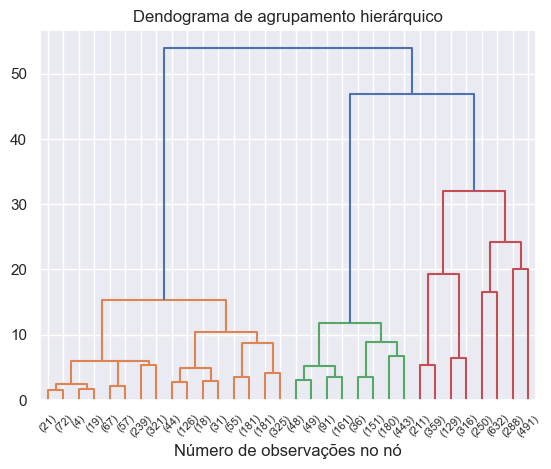

In [59]:
# Consultar a scikit para encontrar o método de agrupamento acumulativo
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

dend = AgglomerativeClustering(distance_threshold=0, n_clusters= None) # Chamada do método
dend = dend.fit(df2_std2)
plt.title("Dendograma de agrupamento hierárquico")
plot_dendrogram(dend, truncate_mode="level", p=4)
plt.xlabel("Número de observações no nó")
plt.show()